In [2]:
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.pyplot as plt
from scipy.special import expit
import matplotlib.cm as cm
from sklearn import metrics
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.metrics import mean_squared_error
import pandas as pd
import numpy as np

In [7]:
# Loading in data
data = pd.read_csv("inputsong3.csv")

# Delete non-number columns
data = data.drop(['Artist'], axis=1)
data = data.drop(['Album'], axis=1)
data = data.drop(['Track ID'], axis=1)
data = data.drop(['Track'], axis=1)

In [8]:
# Mapping Keys to numbers
key_di = {0: "C",0: "B#", 1: "C#", 2: "D", 3: "D#", 4: "E", 5: "F", 5: "E#", 6: "F#", 
          7: "G", 8: "G#", 9: "A", 10: "A#", 11: "B"}
data.replace({"Key": key_di})
data = data.drop(['Key'], axis=1)
data.head()

,Release Date,Popularity,Danceability,Energy,Key Val,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Time Signature
0,2013,31,0.455,0.972,9,-3.025,1,0.1870,0.000193,0.000229,0.387,0.102,133.034,4
1,2011,73,0.733,0.899,0,-4.237,1,0.1430,0.004960,0.000047,0.372,0.760,127.086,4
2,1998,39,0.632,0.926,7,-5.954,1,0.1270,0.008900,0.466000,0.367,0.777,168.284,4
3,1998,30,0.747,0.868,11,-6.360,0,0.0613,0.002470,0.174000,0.494,0.485,110.950,4
4,2000,57,0.690,0.664,5,-7.715,0,0.0542,0.000447,0.034300,0.073,0.630,87.287,4


In [9]:
data = np.asarray(data,dtype=np.float64)
data_count = len(data[:,0])

In [110]:
# kmeans
#kmeans = KMeans(n_clusters=100, random_state=0).fit(data)
#kmeans.labels_
#kmeans.score(data)
#mean_squared_error(data_output,kmeans.labels_)

For n_clusters = 10 The average silhouette_score is : 0.24178666376755192
For n_clusters = 20 The average silhouette_score is : 0.2194381277314989
For n_clusters = 30 The average silhouette_score is : 0.21243590243089763
For n_clusters = 40 The average silhouette_score is : 0.20305239943323794
For n_clusters = 50 The average silhouette_score is : 0.19563832410370577
For n_clusters = 60 The average silhouette_score is : 0.19274624592259537
For n_clusters = 70 The average silhouette_score is : 0.19050352431673132
For n_clusters = 80 The average silhouette_score is : 0.18502187755342803
For n_clusters = 90 The average silhouette_score is : 0.18376766147144882
For n_clusters = 100 The average silhouette_score is : 0.1815299534345155
For n_clusters = 150 The average silhouette_score is : 0.17147997786963684
For n_clusters = 200 The average silhouette_score is : 0.16529475458906964
For n_clusters = 300 The average silhouette_score is : 0.15722564389856764
For n_clusters = 500 The average sil

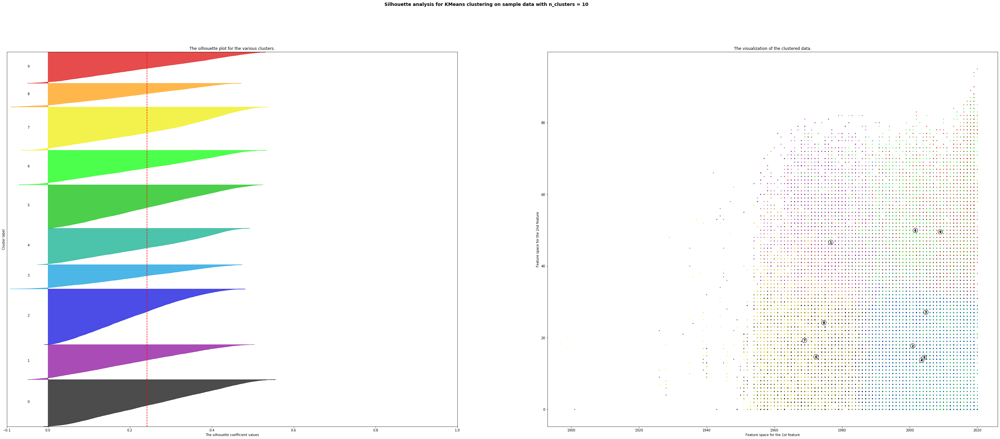

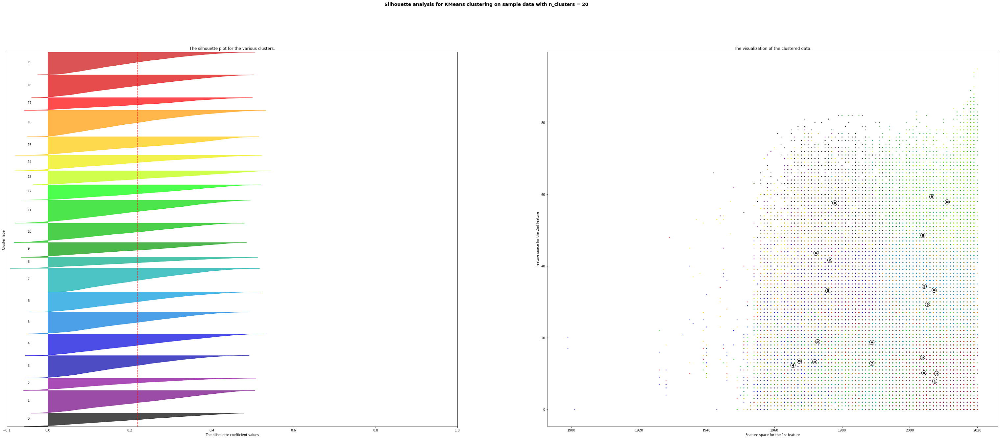

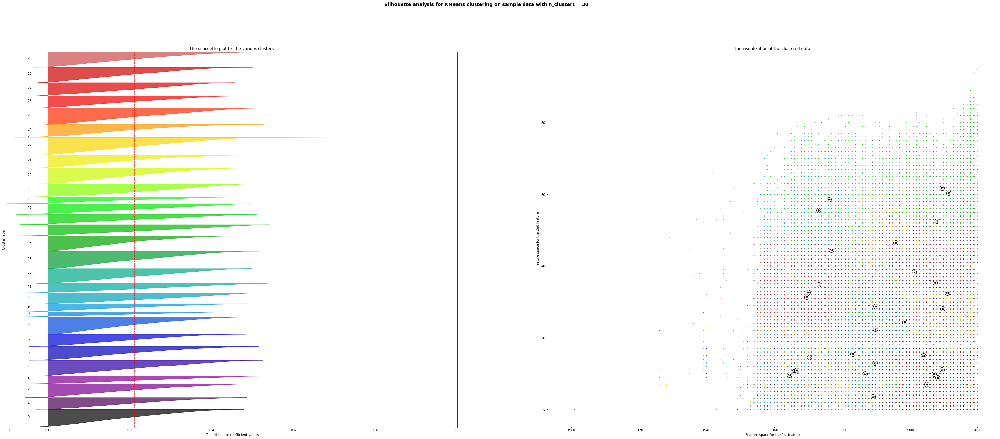

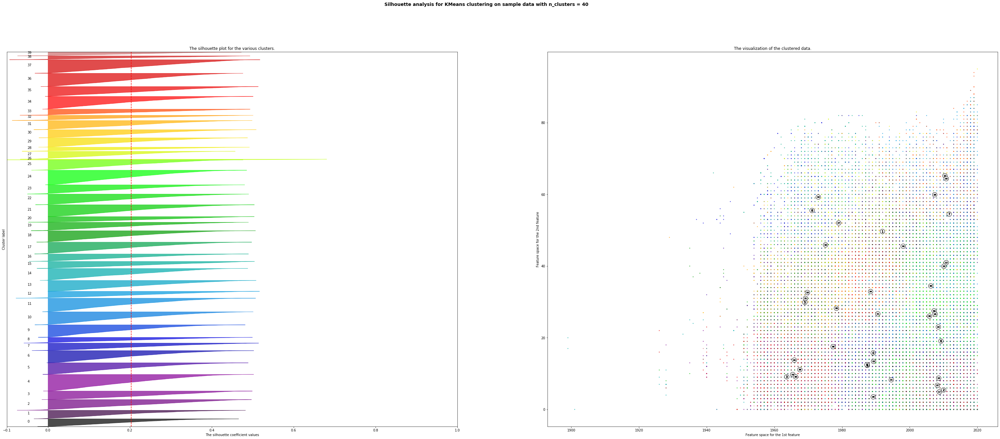

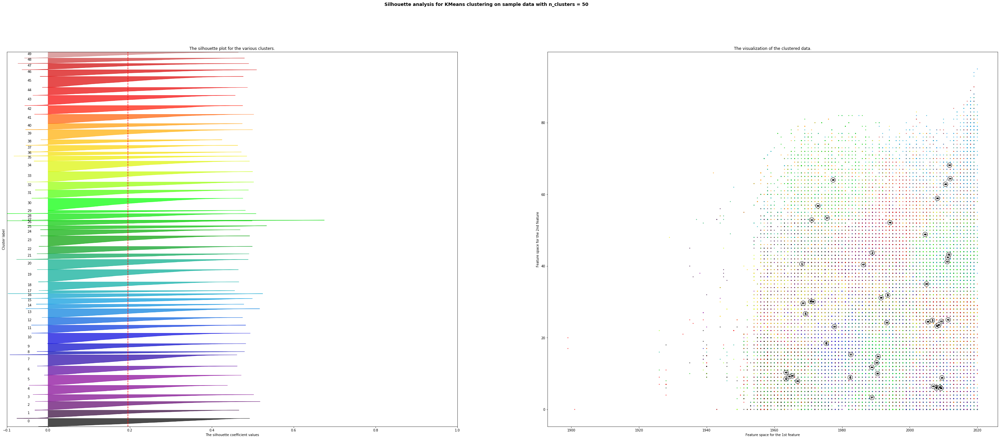

...

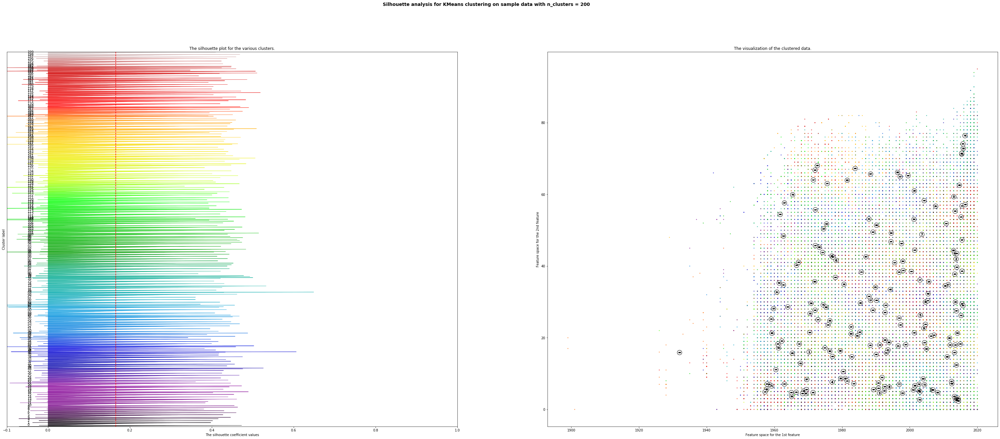

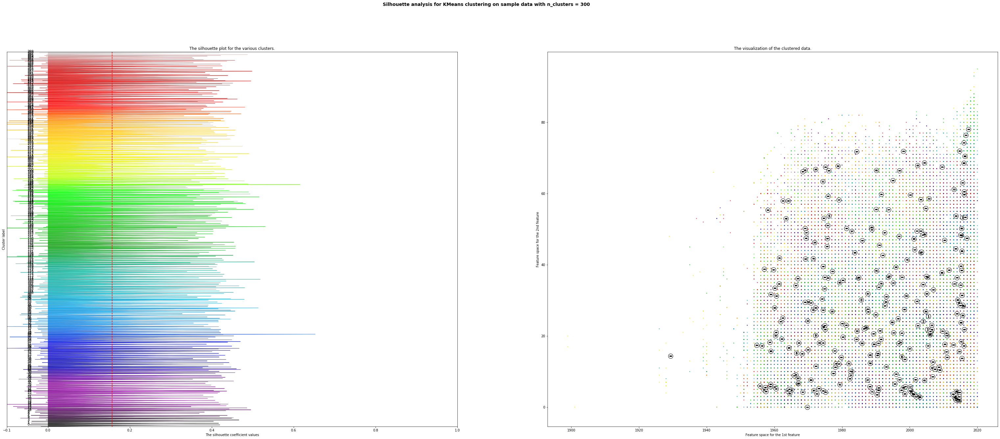

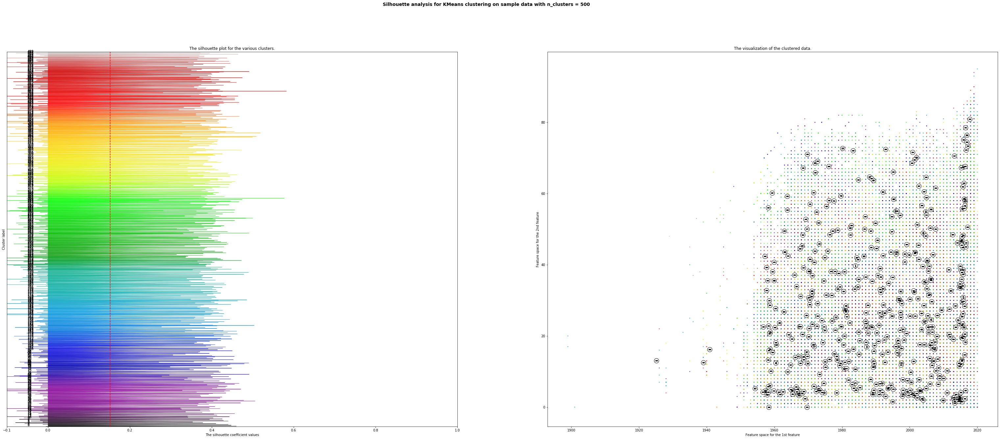

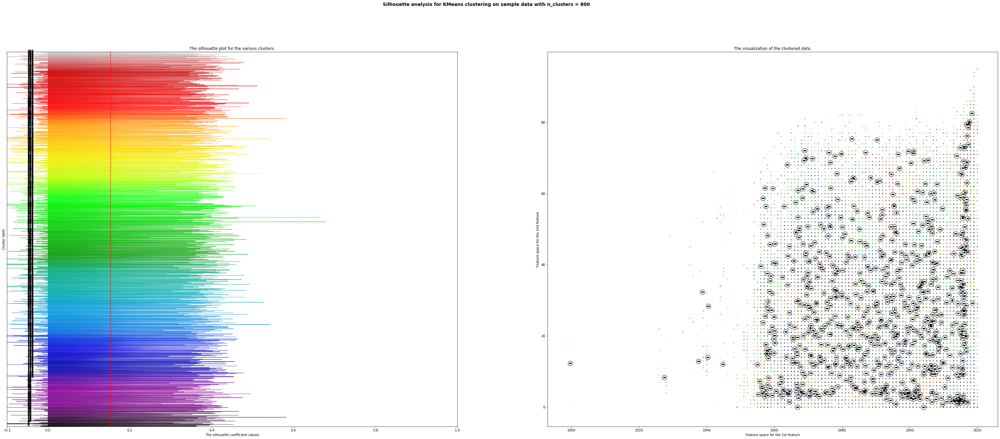

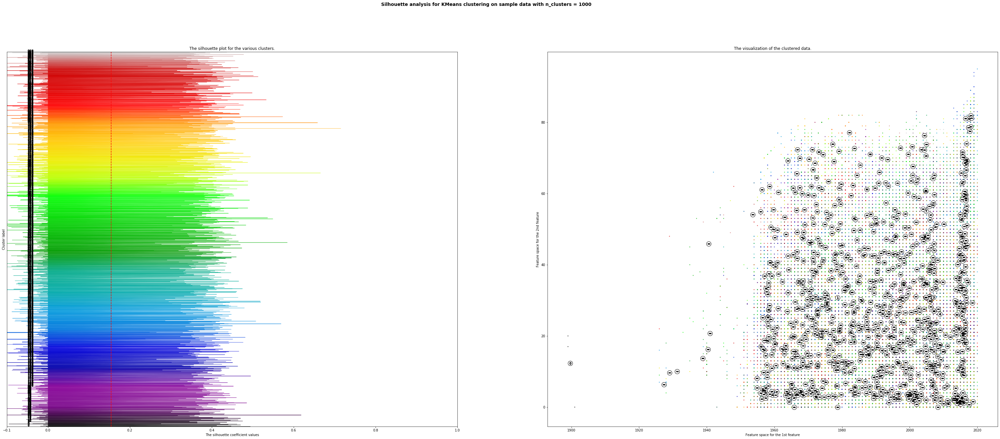

In [113]:
#kmeans analysis
range_n_clusters = [10,20,30,40,50,60,70,80,90,100,150,200,300,500,800,1000]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(54, 21)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(data) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(data)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(data, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(data, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(data[:, 0], data[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

For n_clusters = 2 The average silhouette_score is : 0.3062174336266663
For n_clusters = 3 The average silhouette_score is : 0.23488917503360093
For n_clusters = 4 The average silhouette_score is : 0.24584954323281297
For n_clusters = 5 The average silhouette_score is : 0.24800216707362427
For n_clusters = 6 The average silhouette_score is : 0.24804402303178053
For n_clusters = 7 The average silhouette_score is : 0.2527571120013327
For n_clusters = 8 The average silhouette_score is : 0.2534992265671563
For n_clusters = 9 The average silhouette_score is : 0.24319139465834697


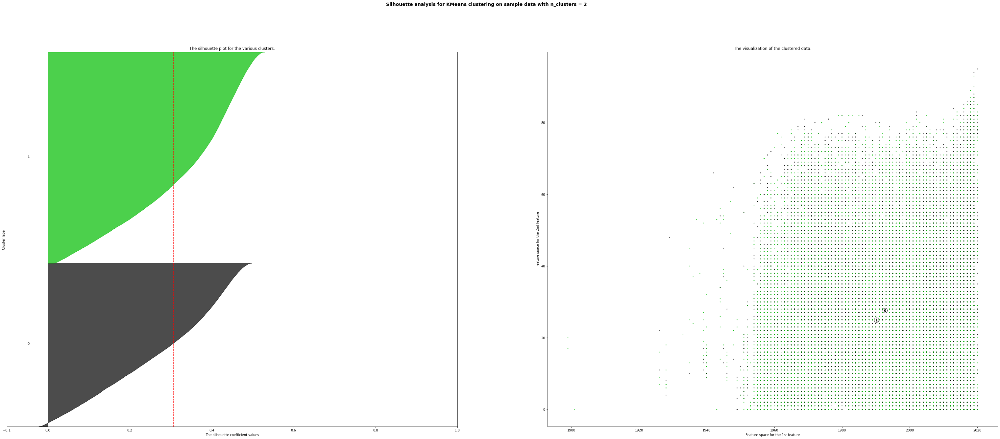

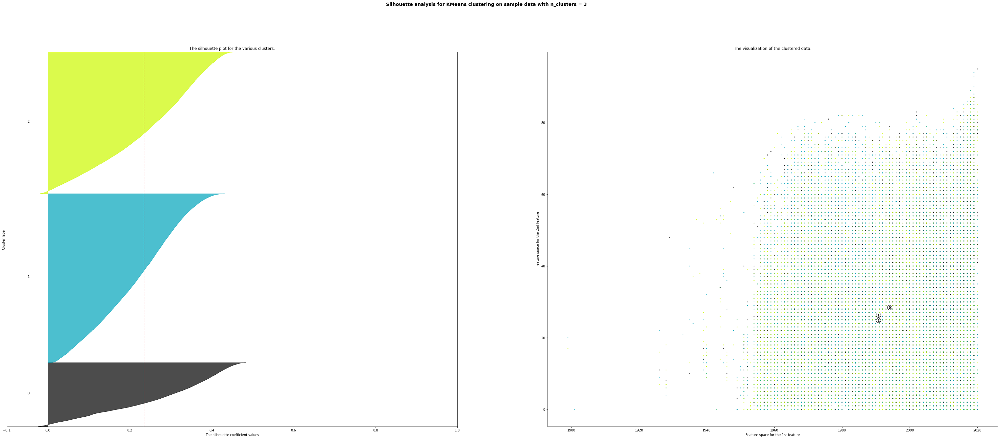

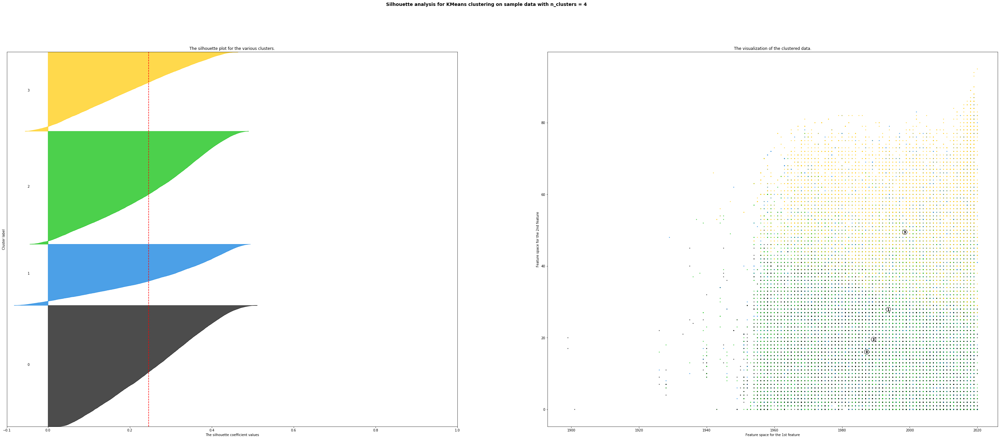

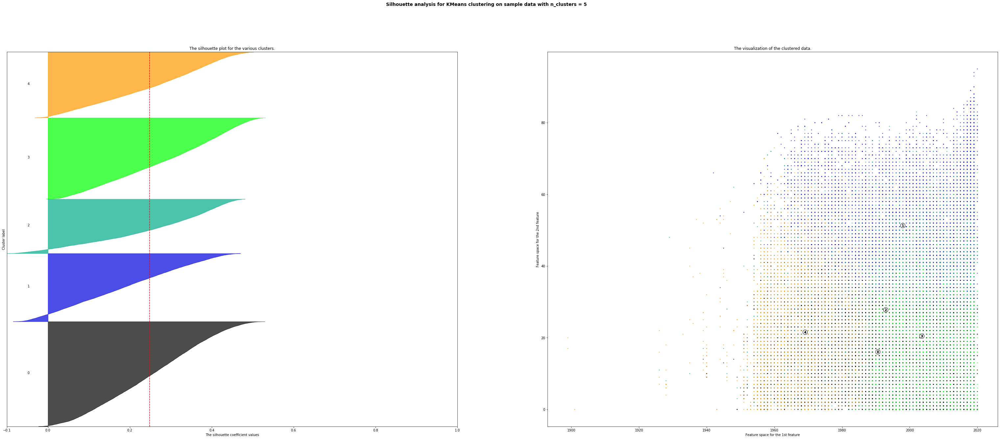

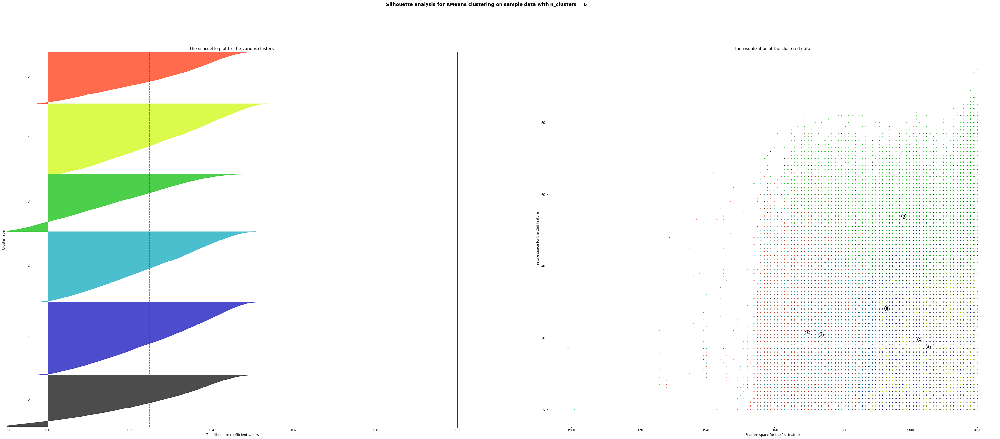

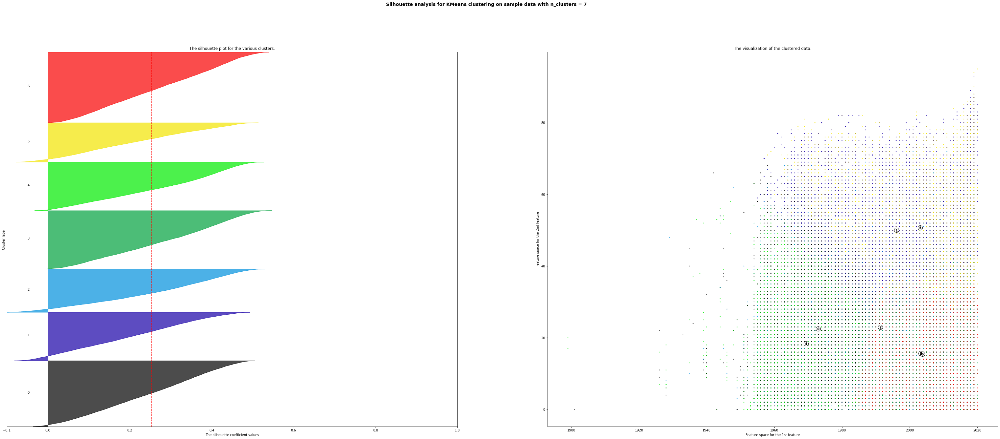

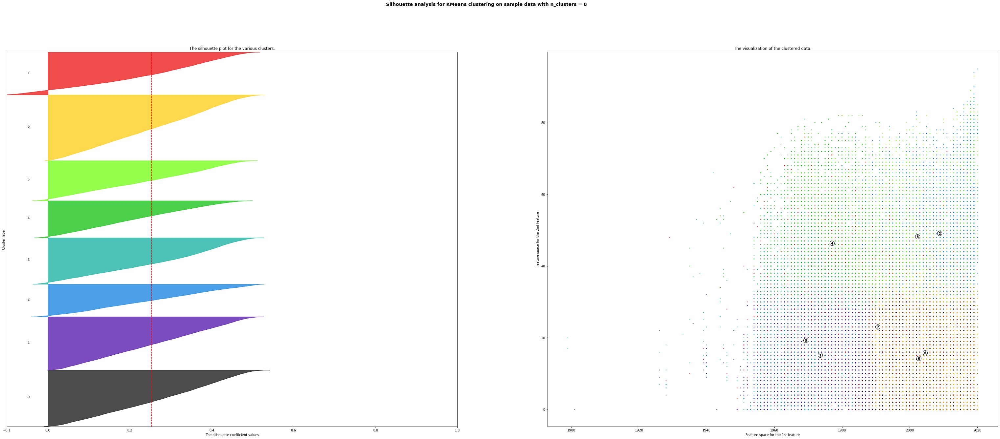

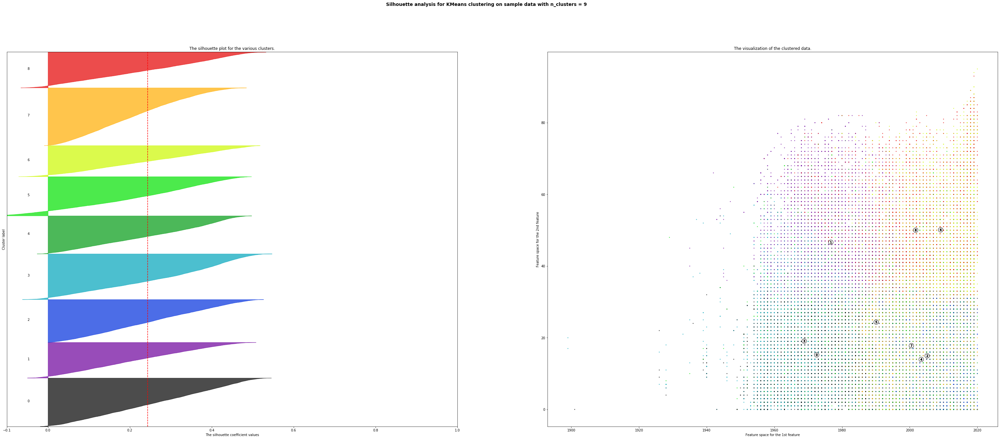

In [115]:
#kmeans analysis
range_n_clusters = [2,3,4,5,6,7,8,9]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(54, 21)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(data) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(data)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(data, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(data, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(data[:, 0], data[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

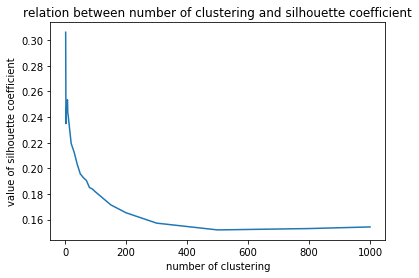

In [4]:
x=[2,3,4,5,6,7,8,9,10,20,30,40,50,60,70,80,90,100,150,200,300,500,800,1000]
y=[0.3062174336266663,0.23488917503360093,0.24584954323281297,0.24800216707362427,0.24804402303178053,
  0.2527571120013327,0.2534992265671563,0.24319139465834697,0.24178666376755192,0.2194381277314989,
   0.21243590243089763,0.20305239943323794,0.19563832410370577,0.19274624592259537,0.19050352431673132,
   0.18502187755342803,0.18376766147144882,0.1815299534345155,0.17147997786963684,0.16529475458906964,
  0.15722564389856764,0.1519183092491719,0.15297966230844787,0.15424218370750659]
plt.plot(x,y)
plt.xlabel('number of clustering') 
# naming the y axis 
plt.ylabel('value of silhouette coefficient') 
  
# giving a title to my graph 
plt.title('relation between number of clustering and silhouette coefficient') 
plt.show()

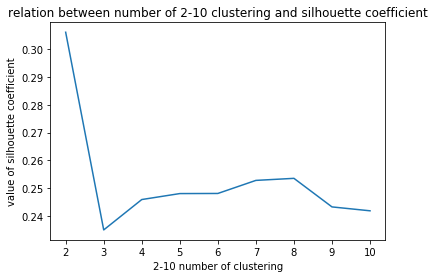

In [5]:
x=[2,3,4,5,6,7,8,9,10]
y=[0.3062174336266663,0.23488917503360093,0.24584954323281297,0.24800216707362427,0.24804402303178053,
  0.2527571120013327,0.2534992265671563,0.24319139465834697,0.24178666376755192]
plt.plot(x,y)
plt.xlabel('2-10 number of clustering') 
# naming the y axis 
plt.ylabel('value of silhouette coefficient') 
  
# giving a title to my graph 
plt.title('relation between number of 2-10 clustering and silhouette coefficient') 
plt.show()

In [17]:
# DBscan
clustering = DBSCAN(eps=3).fit(data)
core_samples_mask = np.zeros_like(clustering.labels_, dtype=bool)
core_samples_mask[clustering.core_sample_indices_] = True
labels = clustering.labels_

In [18]:
# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

In [19]:
dbscanparams = clustering.get_params()
print(dbscanparams)

labels_true = clustering.fit_predict(data)
print(labels_true[:30])

{'algorithm': 'auto', 'eps': 3, 'leaf_size': 30, 'metric': 'euclidean', 'metric_params': None, 'min_samples': 5, 'n_jobs': None, 'p': None}
[ -1  -1  -1  -1  -1 330  -1  -1  -1  -1 835  -1  -1  -1   0  -1  -1  -1
  -1  -1  -1  -1   1  -1  -1  -1  -1 743  -1  -1]


In [20]:
print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)
print("Homogeneity: %0.3f" % metrics.homogeneity_score(labels_true, labels))
print("Completeness: %0.3f" % metrics.completeness_score(labels_true, labels))
print("V-measure: %0.3f" % metrics.v_measure_score(labels_true, labels))
print("Adjusted Rand Index: %0.3f"
      % metrics.adjusted_rand_score(labels_true, labels))
print("Adjusted Mutual Information: %0.3f"
      % metrics.adjusted_mutual_info_score(labels_true, labels))
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(data, labels))

Estimated number of clusters: 940
Estimated number of noise points: 52446
Homogeneity: 1.000
Completeness: 1.000
V-measure: 1.000
Adjusted Rand Index: 1.000
Adjusted Mutual Information: 1.000
Silhouette Coefficient: -0.679


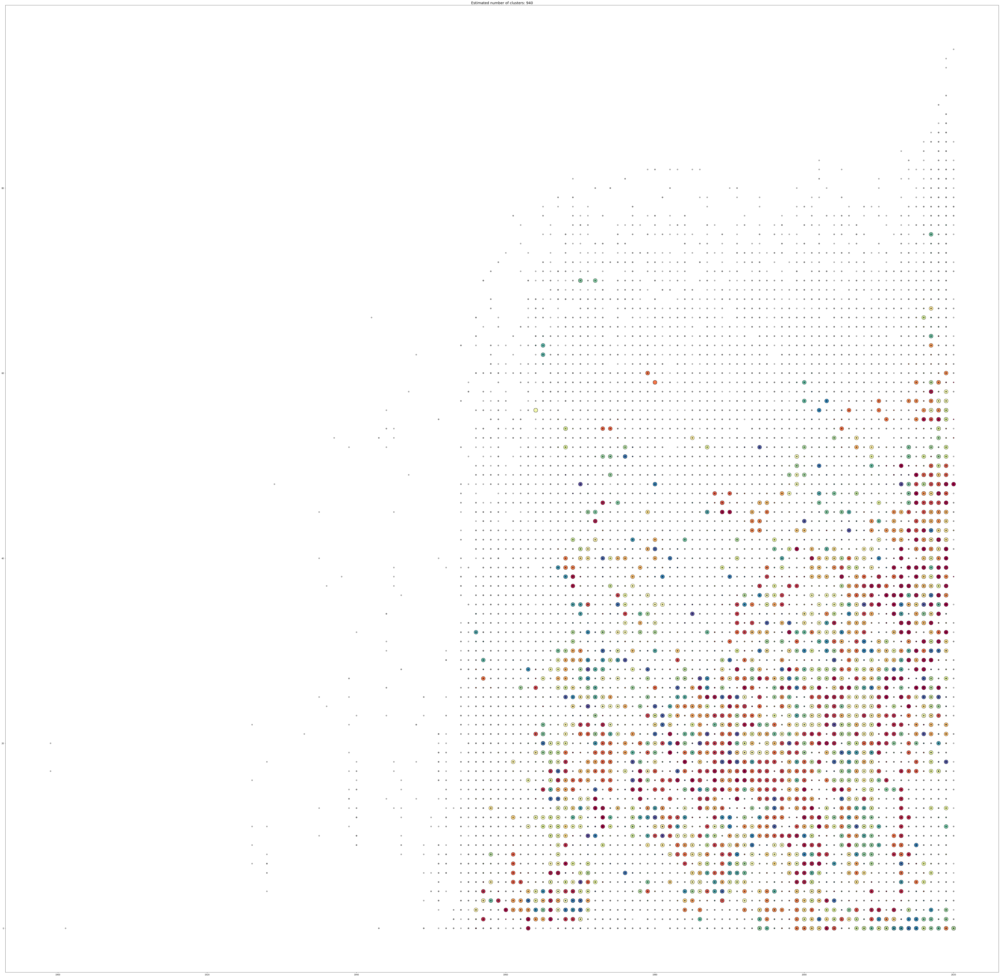

In [21]:
# Black removed and is used for noise instead.
fig= plt.figure(figsize=(90,90),)
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 0]

    class_member_mask = (labels == k)

    xy = data[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=20)

    xy = data[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=5)

plt.title('Estimated number of clusters: %d' % n_clusters_, fontsize=18)
plt.show()